In [487]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns #for plotting
from sklearn.ensemble import RandomForestClassifier #for the model
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz #plot tree
from sklearn.metrics import roc_curve, auc #for model evaluation
from sklearn.metrics import classification_report #for model evaluation
from sklearn.metrics import confusion_matrix #for model evaluation
from sklearn.model_selection import train_test_split #for data splitting
import eli5 #for purmutation importance
from eli5.sklearn import PermutationImportance

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score,accuracy_score,roc_auc_score

from xgboost import XGBClassifier, plot_importance
from pdpbox import pdp, get_dataset, info_plots

# model explainers
import lime
from lime.lime_tabular import LimeTabularExplainer

import shap
from shap import TreeExplainer,KernelExplainer,LinearExplainer
shap.initjs()

import eli5

import shap 

In [488]:
pip install PDPbox

Note: you may need to restart the kernel to use updated packages.


In [489]:
np.random.seed(123) #ensure reproducibility

pd.options.mode.chained_assignment = None  #hide any pandas warnings

In [490]:
from pdpbox import pdp, info_plots #for partial plots

In [491]:
data = pd.read_csv("/Users/odianosenakhibi/Downloads/Thesis/data/heart.csv")

In [492]:
data.head(10)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
5,57,1,0,140,192,0,1,148,0,0.4,1,0,1,1
6,56,0,1,140,294,0,0,153,0,1.3,1,0,2,1
7,44,1,1,120,263,0,1,173,0,0.0,2,0,3,1
8,52,1,2,172,199,1,1,162,0,0.5,2,0,3,1
9,57,1,2,150,168,0,1,174,0,1.6,2,0,2,1


In [493]:
data.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [494]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
age         303 non-null int64
sex         303 non-null int64
cp          303 non-null int64
trestbps    303 non-null int64
chol        303 non-null int64
fbs         303 non-null int64
restecg     303 non-null int64
thalach     303 non-null int64
exang       303 non-null int64
oldpeak     303 non-null float64
slope       303 non-null int64
ca          303 non-null int64
thal        303 non-null int64
target      303 non-null int64
dtypes: float64(1), int64(13)
memory usage: 33.2 KB


In [495]:
data.dtypes

age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca            int64
thal          int64
target        int64
dtype: object

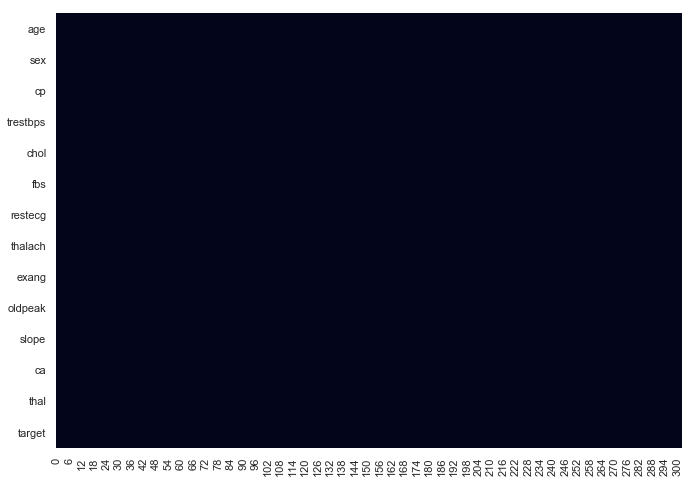

In [536]:
plt.figure(figsize=(10,8))
sns.heatmap(data.isnull().T, cbar=False)

In [496]:
data = pd.get_dummies(data, drop_first=True)

In [497]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


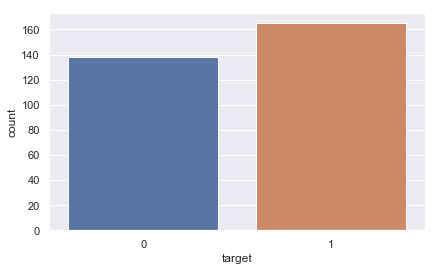

In [498]:
sns.countplot(x='target',data=data)

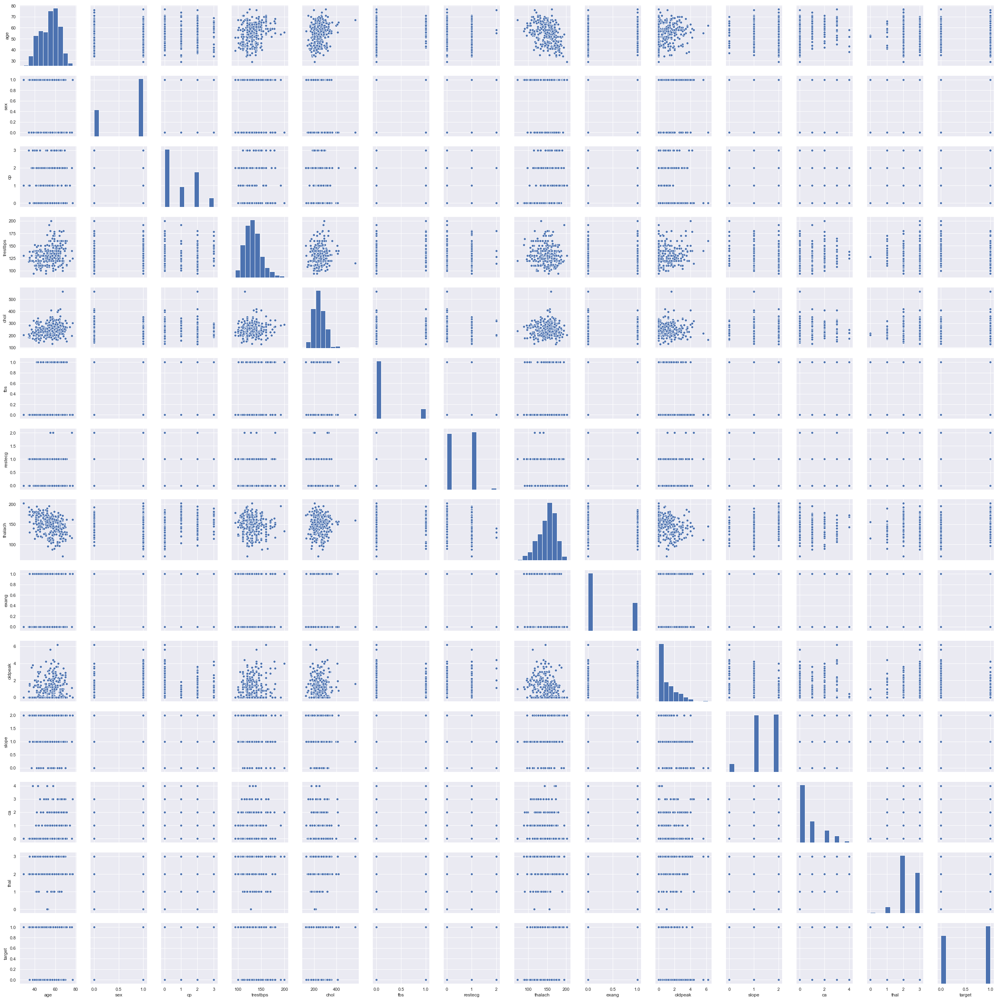

In [499]:
sns.pairplot(data)
plt.show()

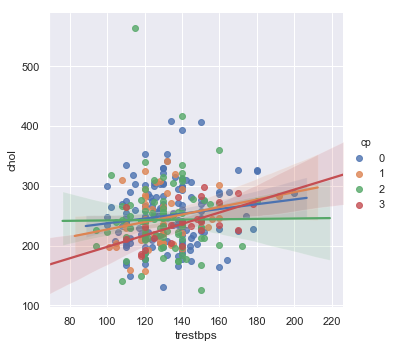

In [500]:
# Show the results of a linear regression within each dataset
sns.lmplot(x="trestbps", y="chol",data=data,hue="cp")
plt.show()

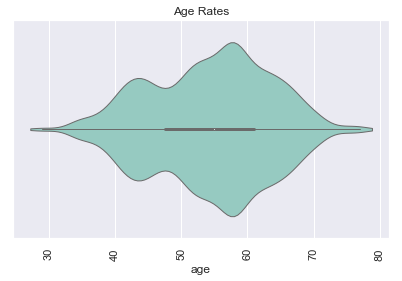

In [501]:
sns.violinplot(data.age, palette="Set3", bw = .2, cut = 1, linewidth = 1)
plt.xticks(rotation = 90)
plt.title("Age Rates")
plt.show()

No handles with labels found to put in legend.


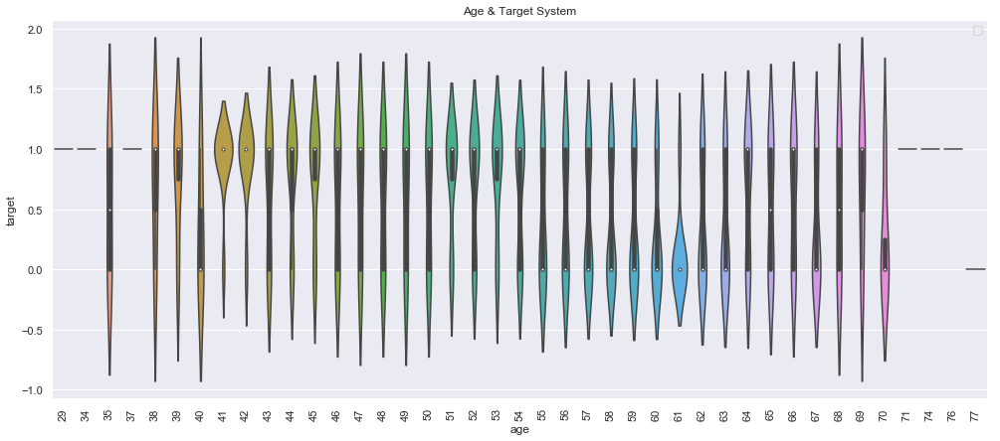

In [502]:
plt.figure(figsize=(15,7))
sns.violinplot(x=data.age,y=data.target)
plt.xticks(rotation=90)
plt.legend()
plt.title("Age & Target System")
plt.show()

In [503]:
#split the data
X_train, X_test, y_train, y_test = train_test_split(data.drop('target', 1), data['target'], test_size = .2, random_state=10)


In [504]:
#Let's see how the correlation values between them
data.corr()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
age,1.000000,-0.098447,-0.068653,0.279351,0.213678,0.121308,-0.116211,-0.398522,0.096801,0.210013,-0.168814,0.276326,0.068001,-0.225439
sex,-0.098447,1.000000,-0.049353,-0.056769,-0.197912,0.045032,-0.058196,-0.044020,0.141664,0.096093,-0.030711,0.118261,0.210041,-0.280937
cp,-0.068653,-0.049353,1.000000,0.047608,-0.076904,0.094444,0.044421,0.295762,-0.394280,-0.149230,0.119717,-0.181053,-0.161736,0.433798
trestbps,0.279351,-0.056769,0.047608,1.000000,0.123174,0.177531,-0.114103,-0.046698,0.067616,0.193216,-0.121475,0.101389,0.062210,-0.144931
chol,0.213678,-0.197912,-0.076904,0.123174,1.000000,0.013294,-0.151040,-0.009940,0.067023,0.053952,-0.004038,0.070511,0.098803,-0.085239
fbs,0.121308,0.045032,0.094444,0.177531,0.013294,1.000000,-0.084189,-0.008567,0.025665,0.005747,-0.059894,0.137979,-0.032019,-0.028046
restecg,-0.116211,-0.058196,0.044421,-0.114103,-0.151040,-0.084189,1.000000,0.044123,-0.070733,-0.058770,0.093045,-0.072042,-0.011981,0.137230
thalach,-0.398522,-0.044020,0.295762,-0.046698,-0.009940,-0.008567,0.044123,1.000000,-0.378812,-0.344187,0.386784,-0.213177,-0.096439,0.421741
exang,0.096801,0.141664,-0.394280,0.067616,0.067023,0.025665,-0.070733,-0.378812,1.000000,0.288223,-0.257748,0.115739,0.206754,-0.436757
oldpeak,0.210013,0.096093,-0.149230,0.193216,0.053952,0.005747,-0.058770,-0.344187,0.288223,1.000000,-0.577537,0.222682,0.210244,-0.430696


In [505]:
model = RandomForestClassifier(max_depth = 5)
model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [506]:
print('X_train',X_train.shape)
print('X_test',X_test.shape)
print('y_train',y_train.shape)
print('y_test',y_test.shape)

X_train (242, 13)
X_test (61, 13)
y_train (242,)
y_test (61,)


In [507]:
#Normalization
X_train=(X_train-np.min(X_train))/(np.max(X_train)-np.min(X_train)).values
X_test=(X_test-np.min(X_test))/(np.max(X_test)-np.min(X_test)).values

In [508]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV,train_test_split,cross_val_score
import os
from sklearn.decomposition import PCA
pca=PCA().fit(X_train)
print(pca.explained_variance_ratio_)
print()
print(X_train.columns.values.tolist())
print(pca.components_)


[0.26660607 0.18654386 0.13106425 0.09225255 0.08271367 0.06165874
 0.04998227 0.03481969 0.03055419 0.02262701 0.01617743 0.01439481
 0.01060546]

['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal']
[[ 5.13933708e-02  5.28061315e-01 -3.41217030e-01  2.68222583e-02
   2.98326391e-03  9.70054722e-02 -6.99436138e-02 -1.25690317e-01
   6.91094908e-01  1.31287883e-01 -1.98641111e-01  1.53910527e-01
   1.15138722e-01]
 [ 7.15079933e-02 -8.33039468e-01 -2.43735535e-01  4.22979394e-02
   6.02519254e-02 -2.69208893e-02  1.15774504e-02 -9.24855341e-02
   4.48026142e-01  7.88497105e-02 -1.35972183e-01  3.94965282e-03
  -3.52753495e-02]
 [ 1.36751197e-01 -8.03874668e-02  2.43746839e-01  1.33261202e-01
   2.16716003e-02  8.83440064e-01 -1.23471264e-01 -4.54388876e-02
  -9.33616922e-02  8.50206895e-02 -2.20364146e-01  1.83900328e-01
  -3.30973490e-02]
 [ 1.28754035e-01  1.96745650e-02 -9.98980605e-02  3.46292505e-02
  -1.73229803e-03 -2.8

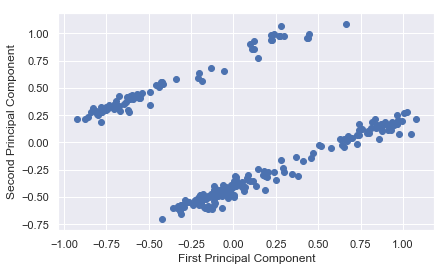

In [509]:
#To  reduce the data dimensions and noise in the input data
pca = PCA(n_components=8)
pca.fit(X_train)
reduced_data_train = pca.transform(X_train)
#inverse_data = pca.inverse_transform(reduced_data)
plt.scatter(reduced_data_train[:, 0], reduced_data_train[:, 1], 
            label='reduced')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

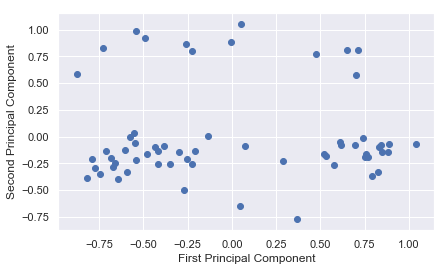

In [510]:
pca = PCA(n_components=8)
pca.fit(X_test)
reduced_data_test = pca.transform(X_test)
#inverse_data = pca.inverse_transform(reduced_data)
plt.scatter(reduced_data_test[:, 0], reduced_data_test[:, 1], 
            label='reduced')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

In [511]:
estimator = model.estimators_[1]
feature_names = [i for i in X_train.columns]
y_train_str = y_train.astype('str')
y_train_str[y_train_str == '0'] = 'no disease'
y_train_str[y_train_str == '1'] = 'disease'
y_train_str = y_train_str.values

In [512]:
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = feature_names,
                class_names = y_train_str,
                rounded = True, proportion = True, 
                label='root',
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')
#to capture the interaction between the features of the data


In [513]:
y_predict = model.predict(X_test)
y_pred_quant = model.predict_proba(X_test)[:, 1]
y_pred_bin = model.predict(X_test)

In [514]:
confusion_matrix = confusion_matrix(y_test, y_pred_bin)
confusion_matrix

array([[11, 24],
       [10, 16]])

In [515]:
total = sum(sum(confusion_matrix))

sensitivity = confusion_matrix[0, 0] / (confusion_matrix[0, 0] + confusion_matrix[1, 0])
print('Sensitivity : ', sensitivity)

specificity = confusion_matrix[1, 1] / (confusion_matrix[1, 1] + confusion_matrix[0, 1])
print('Specificity : ', specificity)

Sensitivity :  0.5238095238095238
Specificity :  0.4


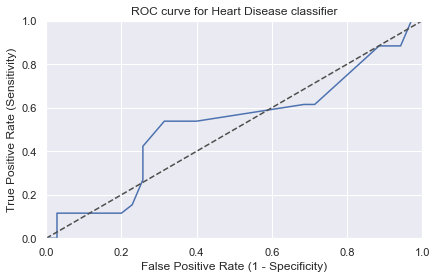

In [516]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_quant)

fig, ax = plt.subplots()
ax.plot(fpr, tpr)
ax.plot([0, 1], [0, 1], transform=ax.transAxes, ls="--", c=".3")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for Heart Disease classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.grid(True)

In [517]:
auc(fpr, tpr)

0.5203296703296703

In [518]:
import seaborn as sns

In [519]:
from xgboost import XGBClassifier, plot_importance

In [520]:
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
%matplotlib inline

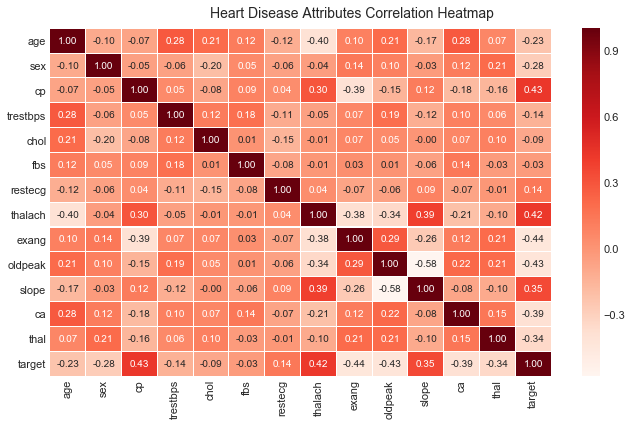

In [521]:
# for visualizing correlations
f, ax = plt.subplots(figsize=(10, 6))
corr = data.corr()
hm = sns.heatmap(round(corr,2), annot=True, ax=ax, cmap="Reds",fmt='.2f',
            linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Heart Disease Attributes Correlation Heatmap', fontsize=14)

In [522]:
target = 'target'
features_list = list(data.columns)
features_list.remove(target)

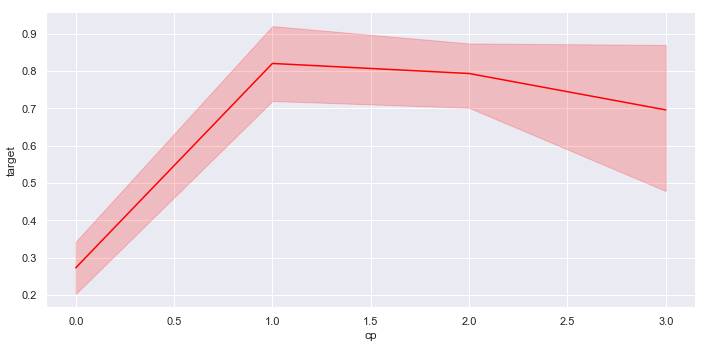

In [523]:
sns.set()
sns.relplot(data = data, x = 'cp', y = target, kind = 'line', height = 5, aspect = 2, color = 'red')

In [524]:
%%time

# ML in two lines ;)
xgb = XGBClassifier(objective='binary:logistic', random_state=33, n_jobs=-1)
xgb.fit(X_train, y_train)

CPU times: user 31.6 ms, sys: 5.24 ms, total: 36.9 ms
Wall time: 44 ms


In [525]:
xgb = XGBClassifier(objective='binary:logistic', random_state=33, n_jobs=-1)
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=33, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1)

In [526]:
xgb_predictions = xgb.predict(X_test)

In [527]:
# We design a simple classification evaluative function
def evaluation_scores(test, prediction, target_names=None):
    print('Accuracy:', np.round(metrics.accuracy_score(test, prediction), 10)) 
    print('-'*60)
    print('classification report:\n\n', metrics.classification_report(y_true=test, y_pred=prediction, target_names=target_names)) 
    
    classes = [0, 1]
    total_classes = len(classes)
    level_labels = [total_classes*[0], list(range(total_classes))]

    cm = metrics.confusion_matrix(y_true=test, y_pred=prediction, labels=classes)
    cm_frame = pd.DataFrame(data=cm, columns=pd.MultiIndex(levels=[['Predicted:'], classes], labels=level_labels), 
                            index=pd.MultiIndex(levels=[['Actual:'], classes], labels=level_labels))
    
    print('-'*60)
    print('Confusion matrix:\n')
    print(cm_frame) 

In [528]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, roc_curve, auc

In [529]:
evaluation_scores(y_test, xgb_predictions, target_names=['no disease', 'disease'])
#Showing the main classification metrics, (precision, recall and f1 score)

Accuracy: 0.8524590164
------------------------------------------------------------
classification report:

               precision    recall  f1-score   support

  no disease       0.86      0.89      0.87        35
     disease       0.84      0.81      0.82        26

   micro avg       0.85      0.85      0.85        61
   macro avg       0.85      0.85      0.85        61
weighted avg       0.85      0.85      0.85        61

------------------------------------------------------------
Confusion matrix:

          Predicted:    
                   0   1
Actual: 0         31   4
        1          5  21


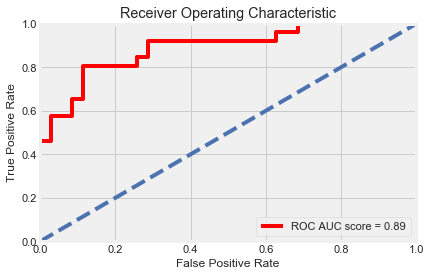

In [303]:
# calculate the FPR and TPR for all thresholds of the classification
probs = xgb.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

#AUC-ROC measures the performance of the classification problem at various thresholds with the ROC curve telling us the ability of the model to distinguish between classes
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'red', label = 'ROC AUC score = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'b--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate') 
plt.show()

In [535]:
auc(fpr,tpr)

0.5203296703296703

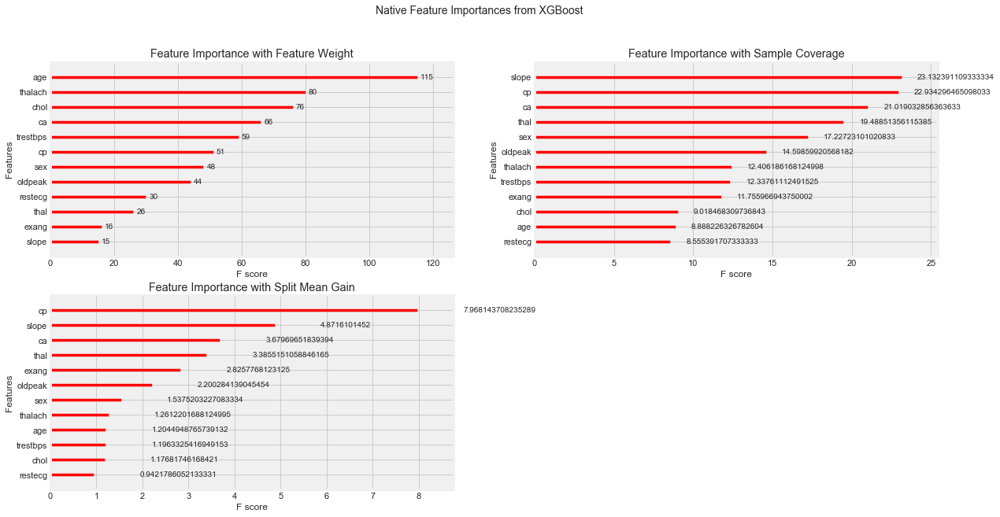

In [304]:
# ploting XGBoost default feature importances
fig = plt.figure(figsize = (18, 10))
title = fig.suptitle("Native Feature Importances from XGBoost", fontsize=14)

ax1 = fig.add_subplot(2, 2, 1)
plot_importance(xgb, importance_type='weight', ax=ax1, color='red')
ax1.set_title("Feature Importance with Feature Weight");

ax2 = fig.add_subplot(2, 2, 2)
plot_importance(xgb, importance_type='cover', ax=ax2, color='red')
ax2.set_title("Feature Importance with Sample Coverage");

ax3 = fig.add_subplot(2, 2, 3)
plot_importance(xgb, importance_type='gain', ax=ax3, color='red')
ax3.set_title("Feature Importance with Split Mean Gain");

In [305]:
import eli5
from eli5.sklearn import PermutationImportance

In [306]:
eli5.show_weights(xgb.get_booster())
#this gives us an idea of how the model performs globally

Weight,Feature
0.2471,cp
0.1511,slope
0.1141,ca
0.1050,thal
0.0876,exang
0.0682,oldpeak
0.0477,sex
0.0391,thalach
0.0373,age
0.0371,trestbps


In [58]:
%%time

# we need to retrain a new model with arrays
# as eli5 has a bug with Dataframes and XGBoost
# cf. https://github.com/TeamHG-Memex/eli5/pull/261
xgb_array = XGBClassifier(objective='binary:logistic', random_state=33, n_jobs=-1)
xgb_array.fit(X_train, y_train)

CPU times: user 42.4 ms, sys: 2.57 ms, total: 45 ms
Wall time: 59.3 ms


In [59]:
xgb_array = XGBClassifier(objective='binary:logistic', random_state=33, n_jobs=-1)
xgb_array.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=33, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1)

In [219]:
feat_permut = PermutationImportance(xgb_array, 
                                    random_state=1).fit(X_train, y_train)
eli5.show_weights(feat_permut, feature_names = features_list)

Weight,Feature
0.0504 ± 0.0062,ca
0.0190 ± 0.0254,restecg
0.0107 ± 0.0134,sex
0.0083 ± 0.0000,oldpeak
0.0025 ± 0.0040,exang
0.0025 ± 0.0040,cp
0 ± 0.0000,thal
0 ± 0.0000,slope
0 ± 0.0000,thalach
0 ± 0.0000,fbs


In [62]:
from pdpbox import pdp, get_dataset, info_plots

In [63]:
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=data, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag)
    plt.show()

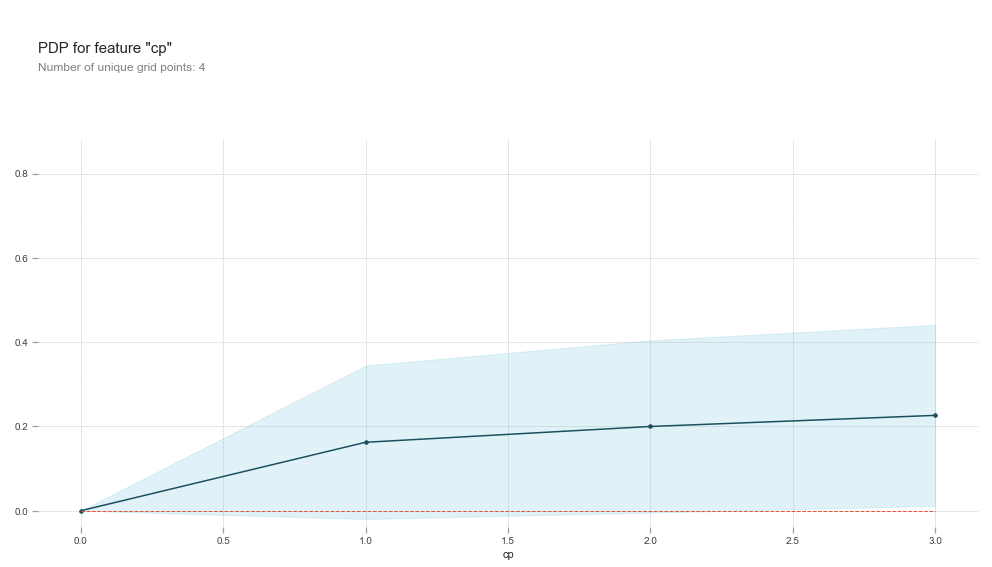

In [64]:
# plot the PD univariate plot
plot_pdp(xgb, X_train, 'cp')

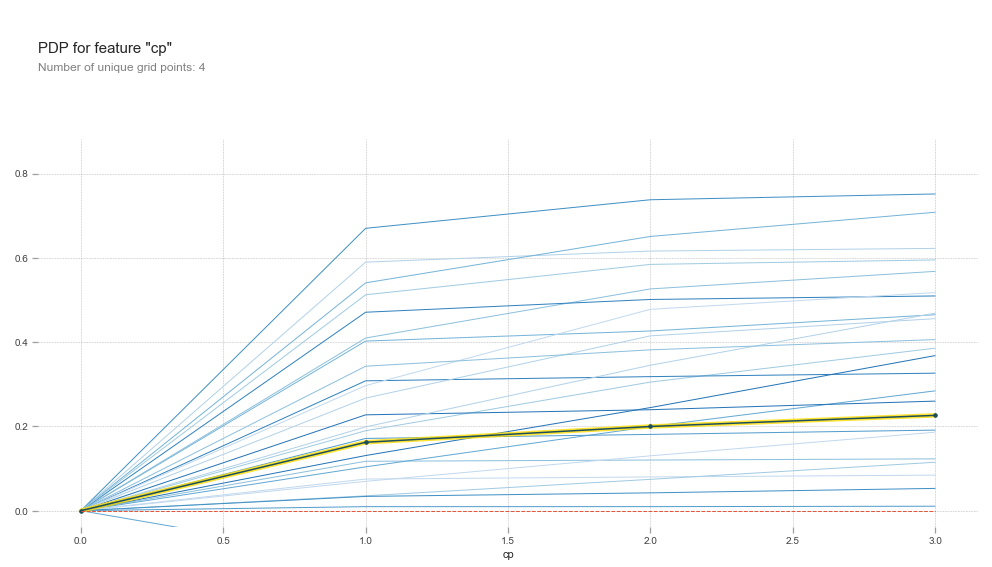

In [65]:
# for ICE plot we must specify the numbers of similarity clusters we want
# here 24
plot_pdp(xgb, X_train, 'cp', cluster_flag=True, nb_clusters=24, lines_flag=True)


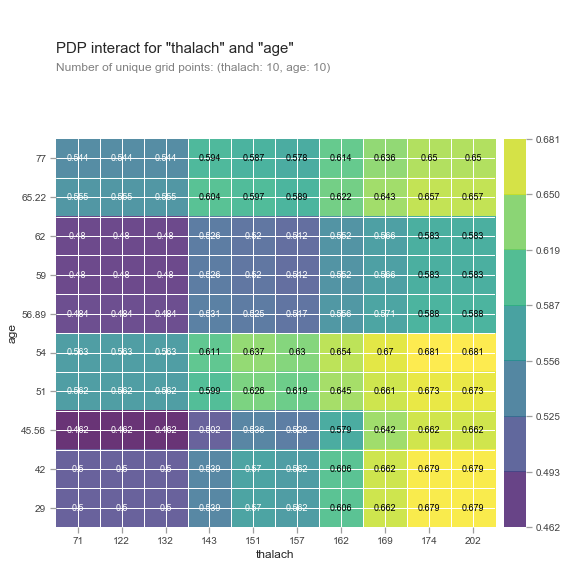

In [68]:
features_to_plot = ['thalach', 'age']
inter1  =  pdp.pdp_interact(model=xgb, dataset=X_train, model_features=features_list, features=features_to_plot)
pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot, plot_type='grid')

# we use plot_type='grid' as the default and better option 'contour' has a bug which is being corrected
# cf. https://github.com/SauceCat/PDPbox/issues/40

plt.show()


In [83]:
cat_cols = list(data.select_dtypes('object').columns)
class_dict = {}
for col in cat_cols:
    data = pd.concat([data.drop(col, axis=1), pd.get_dummies(data[col])], axis=1)
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [84]:
ML_models = {}
model_index = ['LR','RF','NN']
model_sklearn = [LogisticRegression(solver='liblinear',random_state=0),
                 RandomForestClassifier(n_estimators=100,random_state=0),
                 MLPClassifier([100]*5,early_stopping=True,learning_rate='adaptive',random_state=0)]
model_summary = []
for name,model in zip(model_index,model_sklearn):
    ML_models[name] = model.fit(X_train,y_train)
    preds = model.predict(X_test)
    model_summary.append([name,f1_score(y_test,preds,average='weighted'),accuracy_score(y_test,preds),
                          roc_auc_score(y_test,model.predict_proba(X_test)[:,1])])
ML_models

{'LR': LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
           intercept_scaling=1, max_iter=100, multi_class='warn',
           n_jobs=None, penalty='l2', random_state=0, solver='liblinear',
           tol=0.0001, verbose=0, warm_start=False),
 'RF': RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
             max_depth=None, max_features='auto', max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=1, min_samples_split=2,
             min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
             oob_score=False, random_state=0, verbose=0, warm_start=False),
 'NN': MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
        beta_2=0.999, early_stopping=True, epsilon=1e-08,
        hidden_layer_sizes=[100, 100, 100, 100, 100],
        learning_rate='adaptive', learning_rate_init=0.001, max_iter=200,
        momentum=0.9, n_iter_

In [85]:
model_summary = pd.DataFrame(model_summary,columns=['Name','F1_score','Accuracy','AUC_ROC'])
model_summary = model_summary.reset_index()
display(model_summary)

,index,Name,F1_score,Accuracy,AUC_ROC
0,0,LR,0.771734,0.770492,0.880220
1,1,RF,0.787926,0.786885,0.906044
2,2,NN,0.604970,0.622951,0.700000


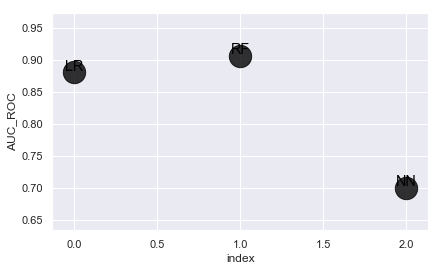

In [86]:
g=sns.regplot(data=model_summary, x="index", y="AUC_ROC", fit_reg=False,
               marker="o", color="black", scatter_kws={'s':500})
 
for i in range(0,model_summary.shape[0]):
     g.text(model_summary.loc[i,'index'], model_summary.loc[i,'AUC_ROC']+0.02, model_summary.loc[i,'Name'], 
            horizontalalignment='center',verticalalignment='top', size='large', color='black')

In [482]:

#initialization of an explainer from LIME
explainer = LimeTabularExplainer(X_train.values,
                                 mode='classification',
                                 feature_names=X_train.columns,
                                 class_names=['disease','no disease'])

In [483]:
exp = explainer.explain_instance(X_test.head(1).values[0],
                                 ML_models['LR'].predict_proba,
                                 num_features=X_train.shape[1])
exp.show_in_notebook(show_table=True, show_all=True)

In [484]:
exp = explainer.explain_instance(X_test.head(1).values[0],
                                 ML_models['RF'].predict_proba,
                                 num_features=X_train.shape[1])
exp.show_in_notebook(show_table=True, show_all=False)

In [485]:
exp = explainer.explain_instance(X_test.head(1).values[0],
                                 ML_models['NN'].predict_proba,
                                 num_features=X_train.shape[1])
exp.show_in_notebook(show_table=True, show_all=False)


In [91]:
#ELI5
eli5.show_weights(ML_models['LR'], feature_names = list(X_test.columns))

Weight?,Feature
+0.777,cp
+0.671,slope
+0.250,<BIAS>
+0.224,restecg
+0.034,thalach
+0.010,age
-0.006,chol
-0.013,fbs
-0.020,trestbps
-0.282,oldpeak


In [92]:
eli5.show_prediction(ML_models['LR'], X_test.head(1).values[0],feature_names=list(X_test.columns))

In [93]:
exp = PermutationImportance(ML_models['LR'],
                            random_state = 0).fit(X_test, y_test)
eli5.show_weights(exp,feature_names=list(X_test.columns))

Weight,Feature
0.0295 ± 0.0435,sex
0.0197 ± 0.0245,thal
0.0131 ± 0.0482,oldpeak
0.0098 ± 0.0161,age
0.0033 ± 0.0564,thalach
0 ± 0.0000,restecg
0 ± 0.0000,fbs
-0.0066 ± 0.0161,chol
-0.0164 ± 0.0415,exang
-0.0197 ± 0.0131,ca


In [94]:
eli5.show_weights(ML_models['RF'],feature_names=list(X_test.columns))

Weight,Feature
0.1568 ± 0.2249,cp
0.1435 ± 0.1671,ca
0.1105 ± 0.1382,thalach
0.0934 ± 0.1468,oldpeak
0.0845 ± 0.0775,chol
0.0835 ± 0.0932,age
0.0744 ± 0.0853,trestbps
0.0637 ± 0.1086,thal
0.0568 ± 0.0926,slope
0.0551 ± 0.1321,exang


In [95]:
eli5.show_prediction(ML_models['RF'], X_test.head(1).values[0],feature_names=list(X_test.columns))

In [96]:
exp = PermutationImportance(ML_models['RF'],
                            random_state = 0).fit(X_test, y_test)
eli5.show_weights(exp,feature_names=list(X_test.columns))

Weight,Feature
0.0295 ± 0.0382,cp
0.0131 ± 0.0321,ca
0.0131 ± 0.0321,age
0.0098 ± 0.0161,sex
0.0066 ± 0.0161,fbs
0.0066 ± 0.0262,trestbps
0.0000 ± 0.0293,thal
0.0000 ± 0.0207,exang
-0.0033 ± 0.0245,thalach
-0.0033 ± 0.0245,restecg


In [97]:
eli5.show_weights(ML_models['NN'])

In [531]:
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X_test)

In [532]:
X_shap = pd.DataFrame(shap_values)
X_shap.tail()

,0,1,2,3,4,5,6,7,8,9,10,11,12
56,-0.124597,-0.467114,0.516053,-0.164124,-0.869036,0.0,-0.022672,-0.571083,0.098964,0.599449,0.317900,0.666939,-0.476225
57,-0.405934,-0.191027,-0.698444,-0.247245,-1.142393,0.0,-0.097391,0.645559,0.260033,0.096249,0.110312,1.604560,0.331815
58,0.739897,-0.451901,-1.497503,-0.155108,-0.288585,0.0,-0.152907,-0.405144,-0.281823,-0.433635,-0.375188,-1.224196,-0.627053
59,-0.313269,-0.274838,-1.391375,-0.216938,0.249524,0.0,0.164028,-0.371982,-0.270568,-0.919981,-0.413974,-1.313632,-0.638178
60,-0.036967,-0.265284,-0.952382,-0.312287,-0.136419,0.0,-0.018374,1.426697,0.257987,0.362001,0.288716,1.241779,-0.870935


In [533]:
print('Expected Value: ', explainer.expected_value)

Expected Value:  0.3926339


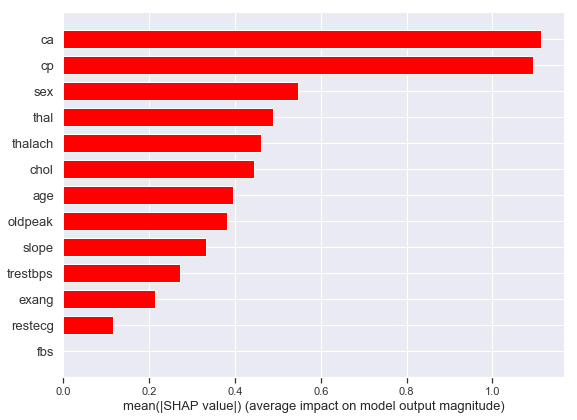

In [534]:
shap.summary_plot(shap_values, X_test, plot_type="bar", color= 'red')

In [98]:
#SHAP
explainer = LinearExplainer(ML_models['LR'], X_train, feature_dependence="independent")
shap_values = explainer.shap_values(X_test.head(1).values)
shap.force_plot(explainer.expected_value,
                shap_values,
                X_test.head(1).values,
                feature_names=X_test.columns)

In [99]:
shap_values = explainer.shap_values(X_test.head(250).values)
shap.force_plot(explainer.expected_value,
                shap_values,
                X_test.head(250).values,
                feature_names=X_test.columns)

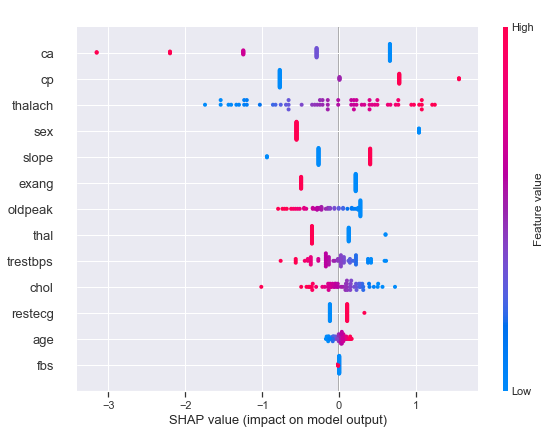

In [100]:
shap_values = explainer.shap_values(X_test.values)
spplot = shap.summary_plot(shap_values, X_test.values, feature_names=X_test.columns)

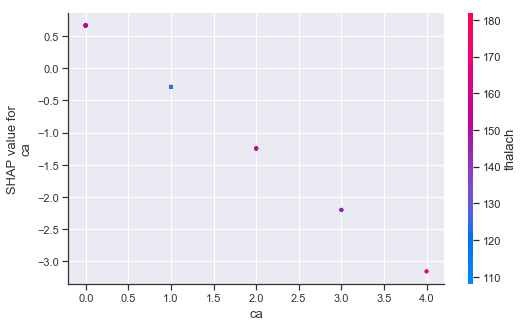

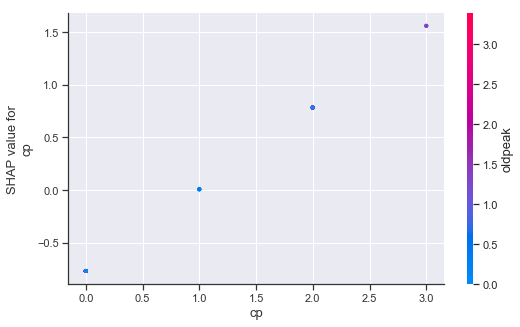

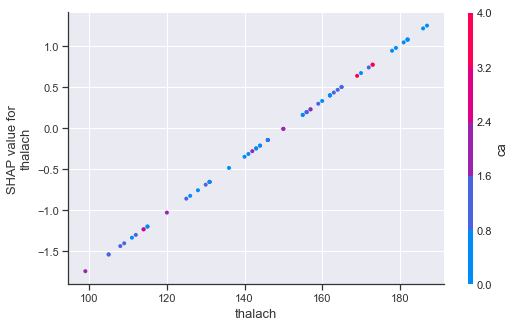

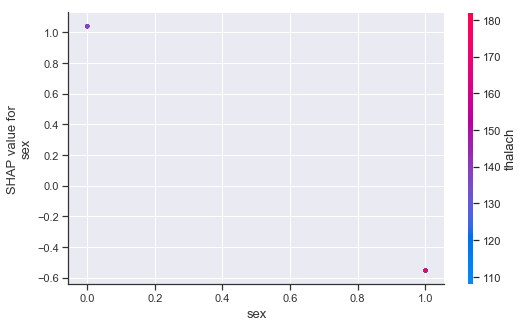

In [101]:
top4_cols = ['ca','cp','thalach','sex']
for col in top4_cols:
    shap.dependence_plot(col, shap_values, X_test)

In [102]:
explainer = TreeExplainer(ML_models['RF'])
shap_values = explainer.shap_values(X_test.head(1).values)
shap.force_plot(explainer.expected_value[1],
                shap_values[1],
                X_test.head(1).values,
                feature_names=X_test.columns)

In [104]:
X_train_kmeans = shap.kmeans(X_train, 10)
explainer = KernelExplainer(ML_models['NN'].predict_proba,X_train_kmeans)
shap_values = explainer.shap_values(X_test.head(1).values)
shap.force_plot(explainer.expected_value[1],
                shap_values[1],
                X_test.head(1).values,
                feature_names=X_test.columns)

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]
